# Person Detection in UAV Aerial Images using YOLOv8s
## SARD Dataset — Search and Rescue (SAR) Mission

This notebook implements the YOLOv8s model fine-tuned on the SARD (Search And Rescue Dataset) for detecting persons in drone aerial images, reproducing and extending the methodology from:

> *Sambolek & Ivasic-Kos (2024). Person Detection and Geolocation Estimation in UAV Aerial Images: An Experimental Approach. ICPRAM 2024.*

### Pipeline Overview
1. Environment setup & dependency installation
2. SARD dataset loading & exploration
3. Dataset preprocessing & YOLO format conversion
3b. **Image Degradation Preprocessing** *(new — simulates real drone image quality)*
4. YOLOv8s model configuration & fine-tuning
5. Evaluation (mAP, Precision, Recall, ROpti)
6. Inference & visualization
7. Results analysis


---
## 1. Environment Setup

In [1]:
import torch

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

# Verify YOLO loads fine
# Upgrade Ultralytics to the latest compatible version
!pip install ultralytics --upgrade -q
from ultralytics import YOLO
print("Ultralytics YOLO loaded successfully")


PyTorch version: 2.10.0+cu128
CUDA available: True
GPU: Tesla T4
GPU Memory: 15.64 GB
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 17.3 MB/s eta 0:00:0000:0100:01
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics YOLO loaded successfully


In [4]:
import os
import cv2
import json
import shutil
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
from PIL import Image
from glob import glob
from tqdm import tqdm
from collections import defaultdict

from ultralytics import YOLO
import yaml

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# Paths
BASE_DIR    = Path('/kaggle/working')
DATA_DIR    = Path('/kaggle/input')          # adjust if dataset path differs
OUTPUT_DIR  = BASE_DIR / 'outputs'
DATASET_DIR = BASE_DIR / 'sard_yolo'

for d in [OUTPUT_DIR, DATASET_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print("Directories created.")
print(f"Working dir : {BASE_DIR}")
print(f"Dataset dir : {DATASET_DIR}")


Directories created.
Working dir : /kaggle/working
Dataset dir : /kaggle/working/sard_yolo


---
## 2. Dataset Loading & Exploration

The **SARD** dataset contains 1,981 drone images (640×360 px) recorded by a DJI Phantom 4 Advanced over continental Croatia, with 6,532 annotated persons. We use the standard 60/40 train/val split from the paper.

**Kaggle dataset**: Search for `SARD Search and Rescue Dataset` or use the Roboflow loader below.


In [5]:
# ── Option A: Dataset already attached to Kaggle notebook ──────────────────
# List what's available under /kaggle/input
input_path = Path('/kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue')
print("Available input datasets:")
for p in sorted(input_path.rglob('*')):
    if p.is_dir():
        n_files = len(list(p.iterdir()))
        print(f"  {p}  ({n_files} items)")
    if len(list(input_path.rglob('*'))) > 100:
        break  # truncate long listings


Available input datasets:


In [6]:
# ── Option B: Download SARD via Roboflow (requires free API key) ────────────
# Uncomment and fill in your Roboflow API key if the dataset is not pre-attached.

USE_ROBOFLOW = False   # set True if using Roboflow download

if USE_ROBOFLOW:
    from roboflow import Roboflow
    rf = Roboflow(api_key="YOUR_ROBOFLOW_API_KEY")   # <-- replace
    project = rf.workspace("search-and-rescue-sar").project("sard")
    dataset = project.version(1).download("yolov8", location=str(DATASET_DIR))
    SARD_ROOT = DATASET_DIR
else:
    # ── Locate the dataset under /kaggle/input ──
    # Adjust SARD_ROOT to match your actual attached dataset folder name.
    # Common patterns after attaching the dataset on Kaggle:
    candidates = list(input_path.glob('sard*')) + list(input_path.glob('SARD*'))
    if candidates:
        SARD_ROOT = candidates[0]
        print(f"Found SARD root: {SARD_ROOT}")
    else:
        SARD_ROOT = input_path   # fallback — inspect manually
        print("WARNING: Could not auto-detect SARD root. Please set SARD_ROOT manually.")

print(f"SARD_ROOT = {SARD_ROOT}")


SARD_ROOT = /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue


In [7]:
def find_image_label_dirs(root: Path):
    """Recursively find image and label directories in a YOLO-formatted dataset."""
    img_dirs = {}
    lbl_dirs = {}
    for split in ['train', 'val', 'valid', 'test']:
        # Images
        for p in root.rglob(f'{split}/images'):
            imgs = list(p.glob('*.jpg')) + list(p.glob('*.png')) + list(p.glob('*.jpeg'))
            if imgs:
                img_dirs[split] = p
        # Labels
        for p in root.rglob(f'{split}/labels'):
            lbls = list(p.glob('*.txt'))
            if lbls:
                lbl_dirs[split] = p
    return img_dirs, lbl_dirs

img_dirs, lbl_dirs = find_image_label_dirs(SARD_ROOT)
print("Image directories found:")
for k, v in img_dirs.items():
    imgs = list(v.glob('*.*'))
    print(f"  {k:10s} → {v} ({len(imgs)} images)")

print("\nLabel directories found:")
for k, v in lbl_dirs.items():
    lbls = list(v.glob('*.txt'))
    print(f"  {k:10s} → {v} ({len(lbls)} label files)")


Image directories found:
  train      → /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/train/images (4041 images)
  valid      → /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/valid/images (1144 images)
  test       → /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/test/images (570 images)

Label directories found:
  train      → /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/train/labels (4041 label files)
  valid      → /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/valid/labels (1144 label files)
  test       → /kaggle/input/datasets/nikolasgegenava/sard-search-and-rescue/search-and-rescue/test/labels (570 label files)


In [8]:
def compute_dataset_stats(img_dir: Path, lbl_dir: Path, split_name: str):
    """Compute statistics matching the paper: total images, persons, object sizes."""
    images   = sorted(img_dir.glob('*.*'))
    n_images = len(images)
    n_persons = 0
    small_objs = medium_objs = large_objs = 0   # thresholds: 32², 96² px
    bbox_areas = []

    for img_path in images:
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        if not lbl_path.exists():
            continue
        img = Image.open(img_path)
        W, H = img.size
        with open(lbl_path) as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue
                _, cx, cy, bw, bh = map(float, parts[:5])
                area_px = (bw * W) * (bh * H)
                bbox_areas.append(area_px)
                n_persons += 1
                if area_px < 32**2:
                    small_objs += 1
                elif area_px < 96**2:
                    medium_objs += 1
                else:
                    large_objs += 1

    print(f"\n{'='*50}")
    print(f" Split: {split_name.upper()}")
    print(f"{'='*50}")
    print(f"  Images       : {n_images}")
    print(f"  Persons      : {n_persons}")
    print(f"  Small  (<32²): {small_objs} ({100*small_objs/max(n_persons,1):.1f}%)")
    print(f"  Medium (32²-96²): {medium_objs} ({100*medium_objs/max(n_persons,1):.1f}%)")
    print(f"  Large  (>96²): {large_objs} ({100*large_objs/max(n_persons,1):.1f}%)")
    if bbox_areas:
        print(f"  Avg bbox area: {np.mean(bbox_areas):.1f} px²")
    return bbox_areas

all_areas = {}
for split in ['train', 'val', 'valid']:
    if split in img_dirs and split in lbl_dirs:
        key = 'val' if split in ('val', 'valid') else split
        all_areas[key] = compute_dataset_stats(img_dirs[split], lbl_dirs[split], split)



 Split: TRAIN
  Images       : 4041
  Persons      : 5229
  Small  (<32²): 783 (15.0%)
  Medium (32²-96²): 3709 (70.9%)
  Large  (>96²): 737 (14.1%)
  Avg bbox area: 5201.6 px²

 Split: VALID
  Images       : 1144
  Persons      : 1463
  Small  (<32²): 207 (14.1%)
  Medium (32²-96²): 1052 (71.9%)
  Large  (>96²): 204 (13.9%)
  Avg bbox area: 5522.4 px²


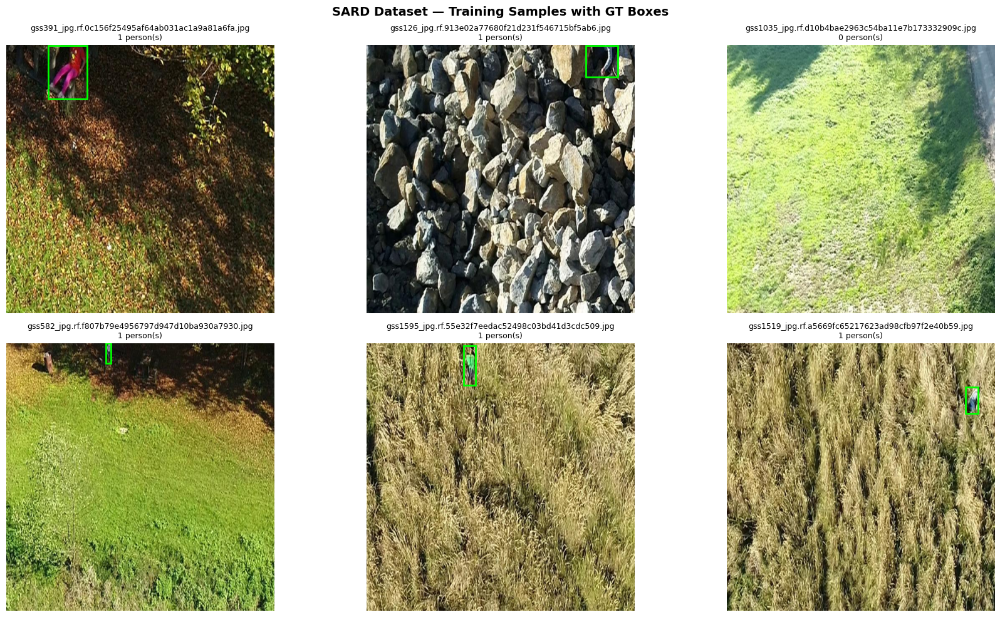

Saved: /kaggle/working/outputs/sample_images.png


In [9]:
def visualize_samples(img_dir: Path, lbl_dir: Path, n: int = 6, title: str = 'Samples'):
    """Display random sample images with ground-truth bounding boxes."""
    images = sorted(img_dir.glob('*.*'))
    samples = random.sample(images, min(n, len(images)))

    cols = 3
    rows = (len(samples) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
    axes = np.array(axes).flatten()

    for ax, img_path in zip(axes, samples):
        img = np.array(Image.open(img_path).convert('RGB'))
        H, W = img.shape[:2]
        ax.imshow(img)
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        n_persons = 0
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    _, cx, cy, bw, bh = map(float, parts[:5])
                    x1 = (cx - bw / 2) * W
                    y1 = (cy - bh / 2) * H
                    rect = patches.Rectangle(
                        (x1, y1), bw * W, bh * H,
                        linewidth=2, edgecolor='lime', facecolor='none'
                    )
                    ax.add_patch(rect)
                    n_persons += 1
        ax.set_title(f"{img_path.name}\n{n_persons} person(s)", fontsize=9)
        ax.axis('off')

    for ax in axes[len(samples):]:
        ax.axis('off')

    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'sample_images.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f"Saved: {OUTPUT_DIR / 'sample_images.png'}")

# Use train split for visualization
train_split = 'train'
if train_split in img_dirs:
    visualize_samples(img_dirs[train_split], lbl_dirs[train_split],
                      n=6, title='SARD Dataset — Training Samples with GT Boxes')


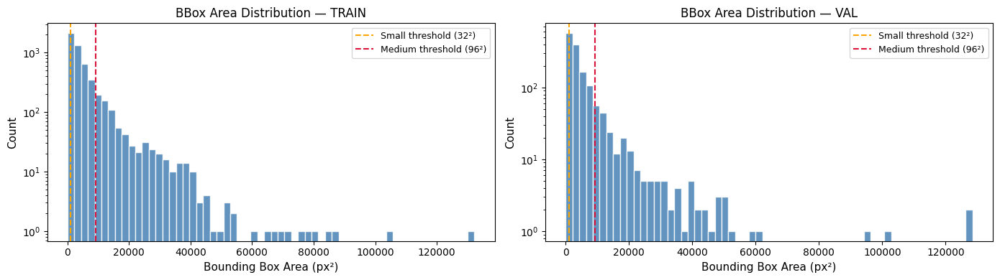

In [10]:
# Bounding box area distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

for ax, (split, areas) in zip(axes, all_areas.items()):
    if not areas:
        continue
    ax.hist(areas, bins=60, color='steelblue', edgecolor='white', alpha=0.85)
    ax.axvline(32**2, color='orange',  linestyle='--', lw=1.5, label='Small threshold (32²)')
    ax.axvline(96**2, color='crimson', linestyle='--', lw=1.5, label='Medium threshold (96²)')
    ax.set_xlabel('Bounding Box Area (px²)', fontsize=11)
    ax.set_ylabel('Count', fontsize=11)
    ax.set_title(f'BBox Area Distribution — {split.upper()}', fontsize=12)
    ax.legend(fontsize=9)
    ax.set_yscale('log')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'bbox_distribution.png', dpi=150, bbox_inches='tight')
plt.show()


---
## 3. Dataset Preprocessing

Following the paper:
- Remove training images where **all person bounding boxes have area < 10² px** (reduces compute without hurting performance)
- Ensure single-class (person only) YOLO format labels
- Build a unified `data.yaml` config


In [11]:
def filter_tiny_persons(
    src_img_dir: Path, src_lbl_dir: Path,
    dst_img_dir: Path, dst_lbl_dir: Path,
    min_area_px: int = 100   # 10x10 px → equivalent to 102 in the paper
):
    """
    Copy images+labels to destination, skipping images where every
    annotation has pixel area < min_area_px (paper: < 102 px).
    Labels are re-written to ensure class index = 0 (person only).
    """
    dst_img_dir.mkdir(parents=True, exist_ok=True)
    dst_lbl_dir.mkdir(parents=True, exist_ok=True)

    images = sorted(src_img_dir.glob('*.*'))
    kept = skipped = 0

    for img_path in tqdm(images, desc=f'Filtering {src_img_dir.parent.name}'):
        lbl_path = src_lbl_dir / (img_path.stem + '.txt')
        img = Image.open(img_path)
        W, H = img.size

        valid_lines = []
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    cls, cx, cy, bw, bh = int(parts[0]), *map(float, parts[1:5])
                    area_px = (bw * W) * (bh * H)
                    if area_px >= min_area_px:
                        # Force class 0 (single-class: person)
                        valid_lines.append(f"0 {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}")

        if not valid_lines:  # skip images with only tiny/absent persons
            skipped += 1
            continue

        shutil.copy(img_path, dst_img_dir / img_path.name)
        with open(dst_lbl_dir / (img_path.stem + '.txt'), 'w') as f:
            f.write('\n'.join(valid_lines))
        kept += 1

    print(f"  Kept: {kept}  |  Skipped (too small): {skipped}")
    return kept


# Build filtered YOLO dataset structure
for split, orig_split in [('train', 'train'), ('val', 'val'), ('val', 'valid')]:
    if orig_split not in img_dirs:
        continue
    dst_img = DATASET_DIR / split / 'images'
    dst_lbl = DATASET_DIR / split / 'labels'
    # Only filter training split; keep val as-is
    min_area = 100 if split == 'train' else 1
    print(f"\nProcessing {split} split (min_area={min_area} px²)...")
    kept = filter_tiny_persons(
        img_dirs[orig_split], lbl_dirs[orig_split],
        dst_img, dst_lbl,
        min_area_px=min_area
    )

print("\nPreprocessing complete.")



Processing train split (min_area=100 px²)...


Filtering train: 100%|██████████| 4041/4041 [00:24<00:00, 164.63it/s]


  Kept: 3470  |  Skipped (too small): 571

Processing val split (min_area=1 px²)...


Filtering valid: 100%|██████████| 1144/1144 [00:06<00:00, 180.25it/s]

  Kept: 967  |  Skipped (too small): 177

Preprocessing complete.


In [12]:
# Verify final split sizes
for split in ['train', 'val']:
    img_p = DATASET_DIR / split / 'images'
    lbl_p = DATASET_DIR / split / 'labels'
    if img_p.exists():
        n_imgs = len(list(img_p.glob('*.*')))
        n_lbls = len(list(lbl_p.glob('*.txt')))
        print(f"{split:6s}: {n_imgs} images, {n_lbls} label files")

# Create YOLO data.yaml
data_yaml = {
    'path'  : str(DATASET_DIR),
    'train' : 'train/images',
    'val'   : 'val/images',
    'nc'    : 1,
    'names' : ['person']
}

yaml_path = DATASET_DIR / 'data.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, default_flow_style=False)

print(f"\ndata.yaml written to: {yaml_path}")
print(open(yaml_path).read())


train : 3470 images, 3470 label files
val   : 967 images, 967 label files

data.yaml written to: /kaggle/working/sard_yolo/data.yaml
names:
- person
nc: 1
path: /kaggle/working/sard_yolo
train: train/images
val: val/images



---
## 3b. Image Degradation Preprocessing *(new)*

Real-world drone footage suffers from several quality issues that the clean SARD images do not reflect:
- **Low effective resolution** — altitude, small sensor, or digital zoom
- **Motion blur / defocus** — vibration, wind, fast shutter
- **Sensor noise** — high ISO, low light, or thermal noise
- **Compression artifacts** — H.264/H.265 encoding from the drone's video stream

Training on degraded images forces the model to learn **robust, low-frequency features** rather than relying on sharp pixel detail — improving generalisation to real drone footage.

### Degradation pipeline (applied per image):
| Step | Effect | Parameter (moderate) |
|------|--------|----------------------|
| Downscale → upscale | Simulate low-res sensor / high altitude | 50% scale factor |
| Gaussian blur | Motion blur / defocus | kernel=5, σ=1.5 |
| Gaussian noise | Sensor / thermal noise | σ=15 px |
| JPEG re-encode | Drone video codec compression | quality=50 |

Set `DEGRADATION_LEVEL` to `'mild'`, `'moderate'`, or `'severe'` to control intensity.  
**Labels are never modified** — only pixel values change.


In [15]:
# ════════════════════════════════════════════════════════════════════════════
# Image Degradation Configuration
# ════════════════════════════════════════════════════════════════════════════

DEGRADED_DIR      = BASE_DIR / 'sard_yolo_degraded'
DEGRADATION_LEVEL = 'severe'   # 'mild' | 'moderate' | 'severe'

DEGRADE_PARAMS = {
    'mild': dict(
        scale_factor = 0.75,
        blur_kernel  = 3,
        blur_sigma   = 1.0,
        noise_std    = 8,
        jpeg_quality = 75,
        apply_scale  = False,
    ),
    'moderate': dict(
        scale_factor = 0.50,
        blur_kernel  = 5,
        blur_sigma   = 1.5,
        noise_std    = 15,
        jpeg_quality = 50,
        apply_scale  = True,
    ),
    'severe': dict(
        scale_factor = 0.30,
        blur_kernel  = 7,
        blur_sigma   = 2.5,
        noise_std    = 25,
        jpeg_quality = 25,
        apply_scale  = True,
    ),
}

print(f"Degradation level : {DEGRADATION_LEVEL}")
print(f"Parameters        : {DEGRADE_PARAMS[DEGRADATION_LEVEL]}")


Degradation level : severe
Parameters        : {'scale_factor': 0.3, 'blur_kernel': 7, 'blur_sigma': 2.5, 'noise_std': 25, 'jpeg_quality': 25, 'apply_scale': True}


In [16]:
def degrade_image(img: np.ndarray, p: dict) -> np.ndarray:
    """
    Apply a stacked degradation pipeline to a single BGR image (numpy uint8).
    All operations are pixel-level; bounding-box labels are unaffected.

    Pipeline order:
        1. Resolution drop  — simulate low-res sensor / high altitude
        2. Gaussian blur    — motion blur or defocus
        3. Gaussian noise   — sensor / thermal noise
        4. JPEG re-encode   — drone video codec compression artifacts
    """
    h, w = img.shape[:2]

    # 1. Resolution drop (downscale → upscale)
    if p['apply_scale']:
        sf = p['scale_factor']
        small = cv2.resize(img,
                           (max(1, int(w * sf)), max(1, int(h * sf))),
                           interpolation=cv2.INTER_LINEAR)
        img = cv2.resize(small, (w, h), interpolation=cv2.INTER_LINEAR)

    # 2. Gaussian blur
    k = p['blur_kernel']
    k = k if k % 2 == 1 else k + 1          # kernel must be odd
    img = cv2.GaussianBlur(img, (k, k), p['blur_sigma'])

    # 3. Gaussian noise
    noise = np.random.normal(0, p['noise_std'], img.shape).astype(np.float32)
    img   = np.clip(img.astype(np.float32) + noise, 0, 255).astype(np.uint8)

    # 4. JPEG compression artifacts
    encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), p['jpeg_quality']]
    _, buf = cv2.imencode('.jpg', img, encode_param)
    img    = cv2.imdecode(buf, cv2.IMREAD_COLOR)

    return img


In [17]:
def build_degraded_dataset(src_dir: Path, dst_dir: Path, params: dict):
    """
    Create a degraded copy of a YOLO dataset.
    Images are degraded; labels are copied unchanged.
    """
    if dst_dir.exists():
        shutil.rmtree(dst_dir)

    for split in ['train', 'val']:
        src_img = src_dir / split / 'images'
        src_lbl = src_dir / split / 'labels'
        dst_img = dst_dir / split / 'images'
        dst_lbl = dst_dir / split / 'labels'

        if not src_img.exists():
            print(f"  [{split}] Skipping — {src_img} not found")
            continue

        dst_img.mkdir(parents=True, exist_ok=True)
        dst_lbl.mkdir(parents=True, exist_ok=True)

        images = sorted(src_img.glob('*.*'))
        print(f"  [{split.upper()}] Degrading {len(images)} images ...")

        for img_path in tqdm(images, desc=split):
            bgr = cv2.imread(str(img_path))
            if bgr is None:
                continue

            degraded = degrade_image(bgr, params)

            # Save degraded image (re-encode at same JPEG quality to bake artifacts)
            out_path = dst_img / img_path.name
            cv2.imwrite(str(out_path), degraded,
                        [int(cv2.IMWRITE_JPEG_QUALITY), params['jpeg_quality']])

            # Copy label unchanged
            lbl = src_lbl / (img_path.stem + '.txt')
            if lbl.exists():
                shutil.copy2(lbl, dst_lbl / lbl.name)

    # Write data.yaml
    degraded_yaml_path = dst_dir / 'data.yaml'
    degraded_yaml_dict = {
        'path'  : str(dst_dir),
        'train' : 'train/images',
        'val'   : 'val/images',
        'nc'    : 1,
        'names' : ['person'],
    }
    with open(degraded_yaml_path, 'w') as f:
        yaml.dump(degraded_yaml_dict, f, default_flow_style=False)

    print(f"\nDegraded dataset  → {dst_dir}")
    print(f"data.yaml         → {degraded_yaml_path}")
    return degraded_yaml_path


print("Building degraded dataset ...")
degraded_yaml = build_degraded_dataset(
    src_dir = DATASET_DIR,
    dst_dir = DEGRADED_DIR,
    params  = DEGRADE_PARAMS[DEGRADATION_LEVEL],
)


Building degraded dataset ...
  [TRAIN] Degrading 3470 images ...


train: 100%|██████████| 3470/3470 [02:32<00:00, 22.74it/s]


  [VAL] Degrading 967 images ...


val: 100%|██████████| 967/967 [00:42<00:00, 22.75it/s]


Degraded dataset  → /kaggle/working/sard_yolo_degraded
data.yaml         → /kaggle/working/sard_yolo_degraded/data.yaml


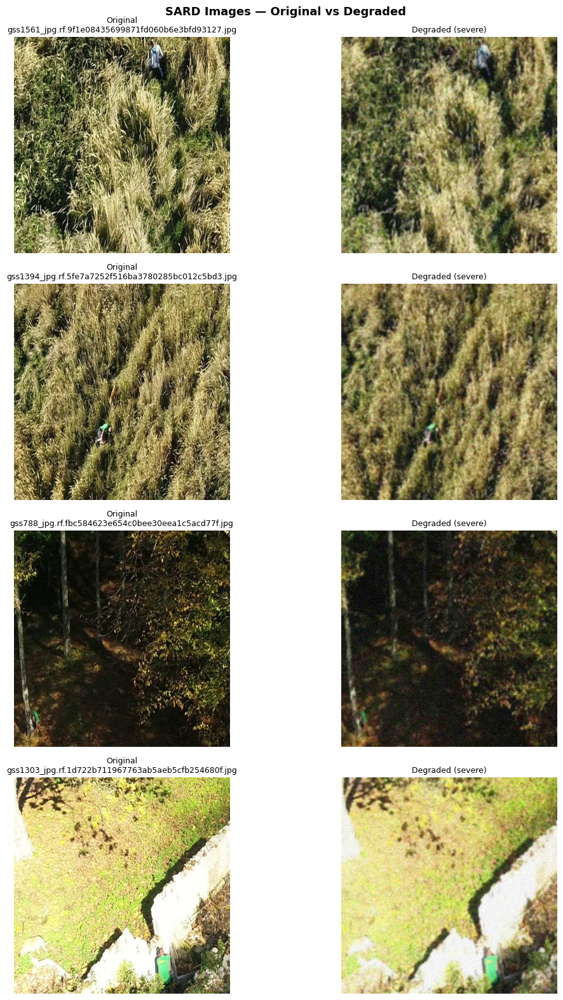

Saved: /kaggle/working/outputs/degradation_comparison.png


In [18]:
# Visual comparison: original vs degraded
def show_degradation_comparison(orig_dir: Path, deg_dir: Path, n: int = 4):
    """Side-by-side comparison of original and degraded images."""
    src_images = sorted((orig_dir / 'train' / 'images').glob('*.*'))
    samples    = random.sample(src_images, min(n, len(src_images)))

    fig, axes = plt.subplots(n, 2, figsize=(12, 4 * n))
    if n == 1:
        axes = [axes]

    for row, img_path in enumerate(samples):
        orig_bgr = cv2.imread(str(img_path))
        deg_path = deg_dir / 'train' / 'images' / img_path.name
        deg_bgr  = cv2.imread(str(deg_path)) if deg_path.exists() else orig_bgr

        orig_rgb = cv2.cvtColor(orig_bgr, cv2.COLOR_BGR2RGB)
        deg_rgb  = cv2.cvtColor(deg_bgr,  cv2.COLOR_BGR2RGB)

        axes[row][0].imshow(orig_rgb)
        axes[row][0].set_title(f'Original\n{img_path.name}', fontsize=9)
        axes[row][0].axis('off')

        axes[row][1].imshow(deg_rgb)
        axes[row][1].set_title(f'Degraded ({DEGRADATION_LEVEL})', fontsize=9)
        axes[row][1].axis('off')

    plt.suptitle('SARD Images — Original vs Degraded', fontsize=13, fontweight='bold')
    plt.tight_layout()
    save_path = OUTPUT_DIR / 'degradation_comparison.png'
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"Saved: {save_path}")

show_degradation_comparison(DATASET_DIR, DEGRADED_DIR, n=4)


In [21]:
# ── Choose which dataset to train on ────────────────────────────────────────
# Set USE_DEGRADED = True  → train on degraded images (recommended for drone deployment)
# Set USE_DEGRADED = False → train on original clean images (baseline)

USE_DEGRADED = True

if USE_DEGRADED:
    TRAIN_YAML = degraded_yaml
    print(f"Training on DEGRADED dataset  (level={DEGRADATION_LEVEL})")
    print(f"data.yaml → {TRAIN_YAML}")
else:
    TRAIN_YAML = yaml_path
    print(f"Training on ORIGINAL dataset")
    print(f"data.yaml → {TRAIN_YAML}")


Training on DEGRADED dataset  (level=severe)
data.yaml → /kaggle/working/sard_yolo_degraded/data.yaml


---
## 4. YOLOv8s Model Training

Training configuration matching the paper:

| Hyperparameter | Value |
|---|---|
| Model | YOLOv8s (11.2 M params) |
| Pretrained | COCO |
| Epochs | 500 |
| Image size | 640 |
| Batch size | 16 |
| Optimizer | SGD |
| Weight decay | 5e-4 |
| Initial LR | 1e-3 |
| Classes | 1 (person) |


In [22]:
# Load YOLOv8s pre-trained on COCO
model = YOLO('yolov8s.pt')

# Print model summary
print(model.info())


YOLOv8s summary: 129 layers, 11,166,560 parameters, 0 gradients, 28.8 GFLOPs
(129, 11166560, 0, 28.816844800000002)


In [23]:
# ── Training ─────────────────────────────────────────────────────────────────
# Tip: On Kaggle P100/T4 (~16 GB VRAM), 500 epochs at batch=16, imgsz=640
# takes ~3-5 hours.  Set epochs=100 for a quick smoke test.

EPOCHS     = 100   # paper uses 500; reduce for faster iteration
BATCH_SIZE = 16
IMG_SIZE   = 640
RUN_NAME   = 'yolov8s_sard_person'

results = model.train(
    data         = str(TRAIN_YAML),    # uses degraded or original depending on USE_DEGRADED
    epochs       = EPOCHS,
    imgsz        = IMG_SIZE,
    batch        = BATCH_SIZE,
    optimizer    = 'SGD',
    lr0          = 1e-3,
    weight_decay = 5e-4,
    warmup_epochs = 3,
    # Augmentation — standard Ultralytics defaults are fine
    hsv_h        = 0.015,
    hsv_s        = 0.7,
    hsv_v        = 0.4,
    degrees      = 0.0,
    translate    = 0.1,
    scale        = 0.5,
    flipud       = 0.0,
    fliplr       = 0.5,
    mosaic       = 1.0,
    mixup        = 0.0,
    # Output
    project      = str(OUTPUT_DIR),
    name         = RUN_NAME,
    exist_ok     = True,
    # Device
    device       = 0 if torch.cuda.is_available() else 'cpu',
    workers      = 4,
    seed         = SEED,
    verbose      = True,
    save         = True,
    save_period  = 50,   # save checkpoint every 50 epochs
    patience     = 50,   # early stopping
    conf         = 0.25,
    iou          = 0.5,
)

print("\nTraining complete!")
print(f"Best model saved at: {OUTPUT_DIR}/{RUN_NAME}/weights/best.pt")


Ultralytics 8.4.41 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=0.25, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/sard_yolo_degraded/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.5, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8s_sard_person, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overla

---
## 5. Training Curves & Metrics

In [24]:
run_dir     = OUTPUT_DIR / RUN_NAME
results_csv = run_dir / 'results.csv'

if results_csv.exists():



    
    df = pd.read_csv(results_csv)
    df.columns = df.columns.str.strip()
    print("Columns:", list(df.columns))
    print(df.tail(5).to_string())
else:
    print(f"results.csv not found at {results_csv}")



Columns: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']
    epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss   lr/pg0   lr/pg1   lr/pg2
95     96  5893.38         0.93706         0.48424         0.96122               0.96866            0.87150           0.87160              0.57334       1.26821       0.56278       1.13810  0.00006  0.00006  0.00006
96     97  5954.46         0.94783         0.49255         0.96545               0.96822            0.87218           0.88130              0.57242       1.27205       0.55969       1.14173  0.00005  0.00005  0.00005
97     98  6015.60         0.94457         0.49508         0.96216               0.96712            0.870

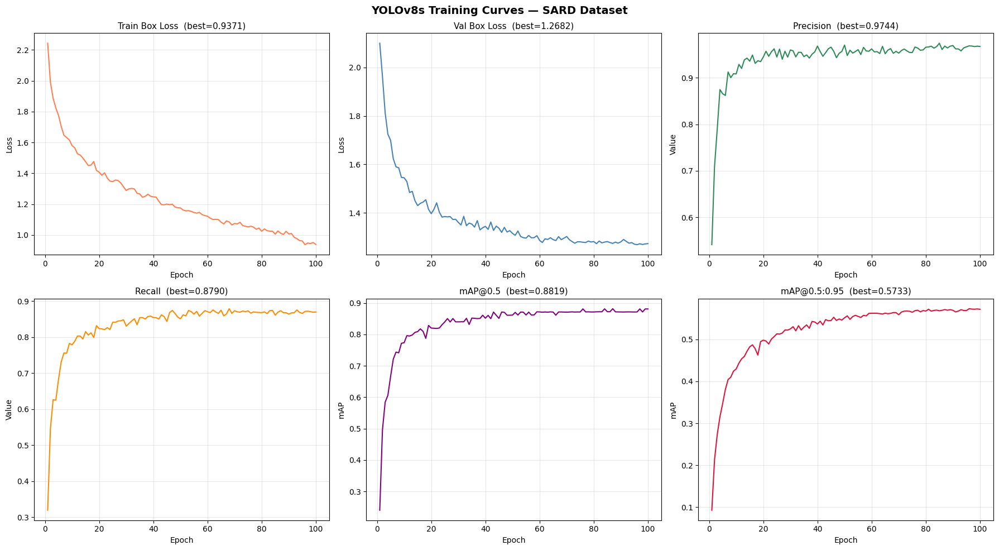

Saved: /kaggle/working/outputs/training_curves.png


In [25]:
if results_csv.exists():
    df = pd.read_csv(results_csv)
    df.columns = df.columns.str.strip()

    # Auto-detect column names (Ultralytics may vary by version)
    col_map = {
        'train_box_loss' : [c for c in df.columns if 'train' in c.lower() and 'box' in c.lower()],
        'train_cls_loss' : [c for c in df.columns if 'train' in c.lower() and 'cls' in c.lower()],
        'val_box_loss'   : [c for c in df.columns if 'val'   in c.lower() and 'box' in c.lower()],
        'precision'      : [c for c in df.columns if 'precision' in c.lower()],
        'recall'         : [c for c in df.columns if 'recall'    in c.lower()],
        'map50'          : [c for c in df.columns if 'map50' in c.lower() and '95' not in c.lower()],
        'map50_95'       : [c for c in df.columns if 'map50' in c.lower() and '95'     in c.lower()],
    }

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    plot_specs = [
        ('train_box_loss', 'Train Box Loss',  'Loss', 'coral'),
        ('val_box_loss',   'Val Box Loss',    'Loss', 'steelblue'),
        ('precision',      'Precision',       'Value','seagreen'),
        ('recall',         'Recall',          'Value','darkorange'),
        ('map50',          'mAP@0.5',         'mAP',  'purple'),
        ('map50_95',       'mAP@0.5:0.95',    'mAP',  'crimson'),
    ]

    for ax, (key, title, ylabel, color) in zip(axes.flatten(), plot_specs):
        cols = col_map.get(key, [])
        if cols:
            ax.plot(df['epoch'] if 'epoch' in df.columns else df.index,
                    df[cols[0]], color=color, linewidth=1.5)
            best_val = df[cols[0]].max() if 'loss' not in key else df[cols[0]].min()
            ax.set_title(f"{title}  (best={best_val:.4f})", fontsize=11)
        else:
            ax.set_title(f"{title} — column not found", fontsize=11)
        ax.set_xlabel('Epoch')
        ax.set_ylabel(ylabel)
        ax.grid(True, alpha=0.3)

    plt.suptitle('YOLOv8s Training Curves — SARD Dataset', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'training_curves.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f"Saved: {OUTPUT_DIR / 'training_curves.png'}")


---
## 6. Evaluation on Validation Set

We evaluate using the same metrics as the paper:
- **Precision (P)** and **Recall (R)**
- **mAP@0.5** and **mAP@0.5:0.95**
- **ROpti** = (TP − FP) / (TP + FN) — penalises false positives, critical in SAR


In [26]:
# Load best checkpoint
best_weights = OUTPUT_DIR / RUN_NAME / 'weights' / 'best.pt'

if not best_weights.exists():
    print(f"WARNING: best.pt not found at {best_weights}")
    print("Using last.pt as fallback...")
    best_weights = OUTPUT_DIR / RUN_NAME / 'weights' / 'last.pt'

print(f"Loading weights from: {best_weights}")
best_model = YOLO(str(best_weights))

# Run validation — always evaluate on the clean val set for fair comparison
val_results = best_model.val(
    data    = str(yaml_path),    # original (clean) val images
    imgsz   = IMG_SIZE,
    batch   = BATCH_SIZE,
    conf    = 0.25,
    iou     = 0.5,
    device  = 0 if torch.cuda.is_available() else 'cpu',
    verbose = True,
)

print("\n" + "="*50)
print(" VALIDATION RESULTS")
print("="*50)
print(f"  Precision    : {val_results.results_dict.get('metrics/precision(B)', 'N/A'):.4f}")
print(f"  Recall       : {val_results.results_dict.get('metrics/recall(B)',    'N/A'):.4f}")
print(f"  mAP@0.5      : {val_results.results_dict.get('metrics/mAP50(B)',     'N/A'):.4f}")
print(f"  mAP@0.5:0.95 : {val_results.results_dict.get('metrics/mAP50-95(B)', 'N/A'):.4f}")


Loading weights from: /kaggle/working/outputs/yolov8s_sard_person/weights/best.pt
Ultralytics 8.4.41 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2119.0±523.1 MB/s, size: 107.4 KB)
val: Scanning /kaggle/working/sard_yolo/val/labels... 967 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 967/967 1.5Kit/s 0.6s0.0ss
val: New cache created: /kaggle/working/sard_yolo/val/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 61/61 4.7it/s 12.9s0.2s
                   all        967       1463      0.906      0.812      0.833      0.491
Speed: 1.0ms preprocess, 9.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

 VALIDATION RESULTS
  Precision    : 0.9064
  Recall       : 0.8120
  mAP@0.5      : 0.8335
  mAP@0.5:0.95 : 0.

In [27]:
def compute_ropti_from_val(model, img_dir: Path, lbl_dir: Path,
                            conf: float = 0.25, iou_thresh: float = 0.5,
                            img_size: int = 640) -> dict:
    """
    Compute ROpti = (TP - FP) / (TP + FN) over all validation images.
    Also returns aggregate Precision and Recall for sanity-check.
    """
    images = sorted(img_dir.glob('*.*'))
    TP = FP = FN = 0

    for img_path in tqdm(images, desc='Computing ROpti'):
        # Ground truth
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        img = Image.open(img_path)
        W, H = img.size
        gt_boxes = []
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    _, cx, cy, bw, bh = map(float, parts[:5])
                    gt_boxes.append([
                        (cx - bw/2) * W, (cy - bh/2) * H,
                        (cx + bw/2) * W, (cy + bh/2) * H
                    ])

        # Predictions
        preds = model.predict(
            str(img_path), conf=conf, iou=iou_thresh,
            imgsz=img_size, verbose=False
        )
        pred_boxes = []
        if preds and preds[0].boxes is not None:
            pred_boxes = preds[0].boxes.xyxy.cpu().numpy().tolist()

        # Match predictions to GT via IoU
        matched_gt = set()
        for pb in pred_boxes:
            best_iou, best_idx = 0, -1
            for gi, gb in enumerate(gt_boxes):
                if gi in matched_gt:
                    continue
                ix1 = max(pb[0], gb[0]); iy1 = max(pb[1], gb[1])
                ix2 = min(pb[2], gb[2]); iy2 = min(pb[3], gb[3])
                inter   = max(0, ix2-ix1) * max(0, iy2-iy1)
                area_p  = (pb[2]-pb[0]) * (pb[3]-pb[1])
                area_g  = (gb[2]-gb[0]) * (gb[3]-gb[1])
                iou_val = inter / (area_p + area_g - inter + 1e-6)
                if iou_val > best_iou:
                    best_iou, best_idx = iou_val, gi
            if best_iou >= iou_thresh and best_idx >= 0:
                TP += 1
                matched_gt.add(best_idx)
            else:
                FP += 1
        FN += len(gt_boxes) - len(matched_gt)

    precision = TP / (TP + FP + 1e-6)
    recall    = TP / (TP + FN + 1e-6)
    ropti     = (TP - FP) / (TP + FN + 1e-6)

    return dict(TP=TP, FP=FP, FN=FN,
                Precision=precision, Recall=recall, ROpti=ropti)


val_split_key = 'val' if 'val' in img_dirs else 'valid'
if val_split_key in img_dirs:
    ropti_results = compute_ropti_from_val(
        best_model,
        DATASET_DIR / 'val' / 'images',
        DATASET_DIR / 'val' / 'labels',
        conf=0.25, iou_thresh=0.5
    )
    print("\n" + "="*50)
    print(" ROPTI & DETECTION METRICS")
    print("="*50)
    for k, v in ropti_results.items():
        fmt = f"{v:.4f}" if isinstance(v, float) else str(v)
        print(f"  {k:<12}: {fmt}")


Computing ROpti: 100%|██████████| 967/967 [00:13<00:00, 71.26it/s]


 ROPTI & DETECTION METRICS
  TP          : 1249
  FP          : 255
  FN          : 214
  Precision   : 0.8305
  Recall      : 0.8537
  ROpti       : 0.6794


In [28]:
# ── Comparison table: our results vs. paper ──────────────────────────────────
paper_results = {
    'Model'          : ['YOLOv8n@SARD', 'YOLOv8s@SARD', 'YOLOv8m@SARD',
                        'YOLOv8l@SARD', 'YOLOv8x@SARD'],
    'Precision (%)'  : [93, 94, 93, 94, 95],
    'Recall (%)'     : [78, 81, 83, 83, 83],
    'mAP@0.5 (%)'    : [86.8, 90.3, 90.6, 90.8, 91.3],
    'mAP@0.5:0.95(%)': [54.9, 60.6, 62.1, 60.8, 63.8],
    'ROpti'          : [0.71, 0.76, 0.77, 0.78, 0.79],
    'Speed (ms)'     : [4.6,  8.0, 17.3, 34.4, 46.5],
}
df_paper = pd.DataFrame(paper_results)

# Add our result row
our_p   = val_results.results_dict.get('metrics/precision(B)', 0) * 100
our_r   = val_results.results_dict.get('metrics/recall(B)',    0) * 100
our_m50 = val_results.results_dict.get('metrics/mAP50(B)',     0) * 100
our_m95 = val_results.results_dict.get('metrics/mAP50-95(B)', 0) * 100
our_ro  = ropti_results.get('ROpti', 0) if 'ropti_results' in dir() else 0

our_row = pd.DataFrame([{
    'Model'           : '★ YOLOv8s@SARD (ours)',
    'Precision (%)'   : round(our_p, 1),
    'Recall (%)'      : round(our_r, 1),
    'mAP@0.5 (%)'     : round(our_m50, 1),
    'mAP@0.5:0.95(%)' : round(our_m95, 1),
    'ROpti'           : round(our_ro, 2),
    'Speed (ms)'      : 'measured below',
}])

df_compare = pd.concat([df_paper, our_row], ignore_index=True)
print("\nComparison with paper results:")
print(df_compare.to_string(index=False))



Comparison with paper results:
                Model  Precision (%)  Recall (%)  mAP@0.5 (%)  mAP@0.5:0.95(%)  ROpti     Speed (ms)
         YOLOv8n@SARD           93.0        78.0         86.8             54.9   0.71            4.6
         YOLOv8s@SARD           94.0        81.0         90.3             60.6   0.76            8.0
         YOLOv8m@SARD           93.0        83.0         90.6             62.1   0.77           17.3
         YOLOv8l@SARD           94.0        83.0         90.8             60.8   0.78           34.4
         YOLOv8x@SARD           95.0        83.0         91.3             63.8   0.79           46.5
★ YOLOv8s@SARD (ours)           90.6        81.2         83.3             49.1   0.68 measured below


---
## 7. Inference & Visualization

In [29]:
import time

val_images = sorted((DATASET_DIR / 'val' / 'images').glob('*.*'))[:50]
if not val_images:
    print("No validation images found for speed test.")
else:
    # Warm-up
    _ = best_model.predict(str(val_images[0]), imgsz=IMG_SIZE, verbose=False)

    start = time.perf_counter()
    for img_path in val_images:
        _ = best_model.predict(str(img_path), imgsz=IMG_SIZE, verbose=False, conf=0.25)
    elapsed = time.perf_counter() - start
    avg_ms = elapsed / len(val_images) * 1000

    print(f"Inference speed: {avg_ms:.2f} ms/image  "
          f"({1000/avg_ms:.1f} FPS)  |  Paper YOLOv8s@SARD: 8.0 ms")


Inference speed: 13.09 ms/image  (76.4 FPS)  |  Paper YOLOv8s@SARD: 8.0 ms


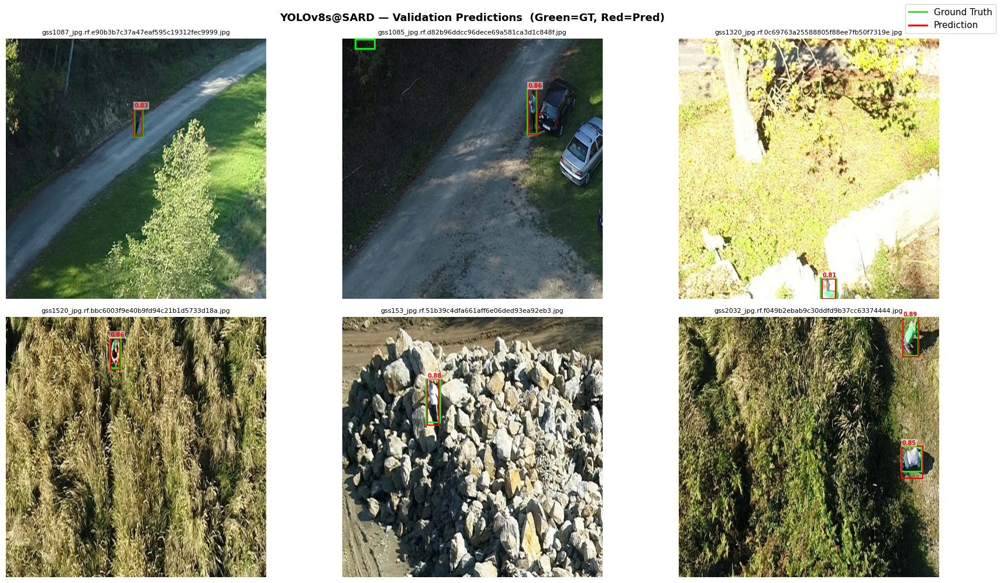

Saved: /kaggle/working/outputs/predictions_visualization.png


In [30]:
def visualize_predictions(model, img_dir: Path, lbl_dir: Path,
                           n: int = 6, conf: float = 0.25,
                           title: str = 'Predictions'):
    """Show GT (green) vs predictions (red) side-by-side."""
    images  = sorted(img_dir.glob('*.*'))
    samples = random.sample(images, min(n, len(images)))

    cols = 3
    rows = (len(samples) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
    axes = np.array(axes).flatten()

    for ax, img_path in zip(axes, samples):
        img_arr = np.array(Image.open(img_path).convert('RGB'))
        H, W    = img_arr.shape[:2]
        ax.imshow(img_arr)

        # GT boxes (green)
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        if lbl_path.exists():
            with open(lbl_path) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    _, cx, cy, bw, bh = map(float, parts[:5])
                    x1 = (cx - bw/2) * W; y1 = (cy - bh/2) * H
                    ax.add_patch(patches.Rectangle(
                        (x1, y1), bw*W, bh*H,
                        linewidth=2, edgecolor='lime', facecolor='none', label='GT'
                    ))

        # Predicted boxes (red)
        preds = model.predict(str(img_path), conf=conf, imgsz=IMG_SIZE, verbose=False)
        if preds and preds[0].boxes is not None:
            for box in preds[0].boxes:
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                score = float(box.conf[0].cpu())
                ax.add_patch(patches.Rectangle(
                    (x1, y1), x2-x1, y2-y1,
                    linewidth=1.5, edgecolor='red', facecolor='none'
                ))
                ax.text(x1, y1-4, f"{score:.2f}", color='red',
                        fontsize=7, fontweight='bold',
                        bbox=dict(facecolor='white', alpha=0.5, pad=1, edgecolor='none'))

        ax.set_title(img_path.name, fontsize=8)
        ax.axis('off')

    # Legend
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='lime', lw=2, label='Ground Truth'),
        Line2D([0], [0], color='red',  lw=2, label='Prediction'),
    ]
    fig.legend(handles=legend_elements, loc='upper right', fontsize=11)

    for ax in axes[len(samples):]:
        ax.axis('off')

    plt.suptitle(title, fontsize=13, fontweight='bold')
    plt.tight_layout()
    save_path = OUTPUT_DIR / 'predictions_visualization.png'
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"Saved: {save_path}")


visualize_predictions(
    best_model,
    DATASET_DIR / 'val' / 'images',
    DATASET_DIR / 'val' / 'labels',
    n=6, conf=0.25,
    title='YOLOv8s@SARD — Validation Predictions  (Green=GT, Red=Pred)'
)


Running confidence threshold sweep (this may take a few minutes)...


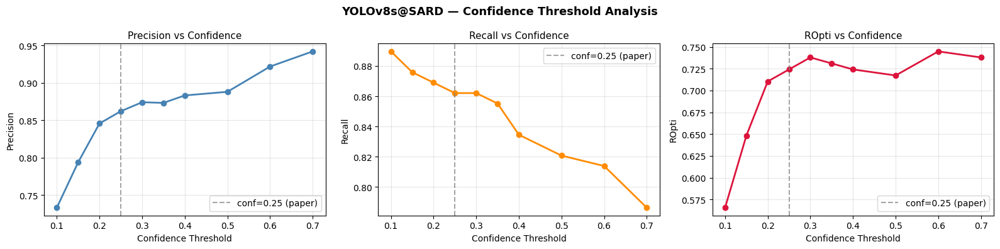

 conf  Precision   Recall    ROpti
 0.10   0.732955 0.889655 0.565517
 0.15   0.793750 0.875862 0.648276
 0.20   0.845638 0.868966 0.710345
 0.25   0.862069 0.862069 0.724138
 0.30   0.874126 0.862069 0.737931
 0.35   0.873239 0.855172 0.731034
 0.40   0.883212 0.834483 0.724138
 0.50   0.888060 0.820690 0.717241
 0.60   0.921875 0.813793 0.744828
 0.70   0.942149 0.786207 0.737931


In [25]:
def sweep_confidence(
    model, img_dir: Path, lbl_dir: Path,
    thresholds=None, iou_thresh: float = 0.5, sample_size: int = 100
):
    """Sweep confidence threshold and compute Precision, Recall, ROpti."""
    if thresholds is None:
        thresholds = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.5, 0.6, 0.7]

    images = sorted(img_dir.glob('*.*'))
    if len(images) > sample_size:
        images = random.sample(images, sample_size)

    rows = []
    for conf in thresholds:
        TP = FP = FN = 0
        for img_path in tqdm(images, desc=f'conf={conf:.2f}', leave=False):
            lbl_path = lbl_dir / (img_path.stem + '.txt')
            img = Image.open(img_path); W, H = img.size
            gt_boxes = []
            if lbl_path.exists():
                with open(lbl_path) as f:
                    for line in f:
                        p = line.strip().split()
                        if len(p) < 5: continue
                        _, cx, cy, bw, bh = map(float, p[:5])
                        gt_boxes.append([
                            (cx-bw/2)*W, (cy-bh/2)*H,
                            (cx+bw/2)*W, (cy+bh/2)*H
                        ])
            preds = model.predict(str(img_path), conf=conf,
                                  imgsz=IMG_SIZE, verbose=False)
            pred_boxes = []
            if preds and preds[0].boxes is not None:
                pred_boxes = preds[0].boxes.xyxy.cpu().numpy().tolist()
            matched = set()
            for pb in pred_boxes:
                best_iou, best_idx = 0, -1
                for gi, gb in enumerate(gt_boxes):
                    if gi in matched: continue
                    ix1=max(pb[0],gb[0]); iy1=max(pb[1],gb[1])
                    ix2=min(pb[2],gb[2]); iy2=min(pb[3],gb[3])
                    inter=max(0,ix2-ix1)*max(0,iy2-iy1)
                    ap=(pb[2]-pb[0])*(pb[3]-pb[1])
                    ag=(gb[2]-gb[0])*(gb[3]-gb[1])
                    iou_v=inter/(ap+ag-inter+1e-6)
                    if iou_v>best_iou: best_iou,best_idx=iou_v,gi
                if best_iou>=iou_thresh and best_idx>=0:
                    TP+=1; matched.add(best_idx)
                else: FP+=1
            FN += len(gt_boxes)-len(matched)
        rows.append(dict(
            conf=conf,
            Precision=TP/(TP+FP+1e-6),
            Recall=TP/(TP+FN+1e-6),
            ROpti=(TP-FP)/(TP+FN+1e-6)
        ))
    return pd.DataFrame(rows)


print("Running confidence threshold sweep (this may take a few minutes)...")
sweep_df = sweep_confidence(
    best_model,
    DATASET_DIR / 'val' / 'images',
    DATASET_DIR / 'val' / 'labels',
    sample_size=100
)

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, col, color in zip(axes,
                           ['Precision', 'Recall', 'ROpti'],
                           ['steelblue', 'darkorange', 'crimson']):
    ax.plot(sweep_df['conf'], sweep_df[col], marker='o', color=color, lw=2)
    ax.axvline(0.25, linestyle='--', color='gray', alpha=0.7, label='conf=0.25 (paper)')
    ax.set_xlabel('Confidence Threshold'); ax.set_ylabel(col)
    ax.set_title(f'{col} vs Confidence', fontsize=11)
    ax.legend(); ax.grid(True, alpha=0.3)

plt.suptitle('YOLOv8s@SARD — Confidence Threshold Analysis', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'confidence_sweep.png', dpi=150, bbox_inches='tight')
plt.show()
print(sweep_df.to_string(index=False))


---
## 8. Export & Save Artifacts

In [26]:
# Export to ONNX for deployment / faster CPU inference
print("Exporting to ONNX...")
onnx_path = best_model.export(format='onnx', imgsz=IMG_SIZE, opset=12, simplify=True)
print(f"ONNX model saved: {onnx_path}")

# Copy key artifacts to OUTPUT_DIR
for fname in ['best.pt', 'last.pt']:
    src = OUTPUT_DIR / RUN_NAME / 'weights' / fname
    if src.exists():
        shutil.copy(src, OUTPUT_DIR / fname)
        print(f"Copied {fname} → {OUTPUT_DIR / fname}")


Exporting to ONNX...
Ultralytics 8.4.41 🚀 Python-3.12.12 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/kaggle/working/outputs/yolov8s_sard_person/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (21.5 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 12 packages in 186ms
Prepared 2 packages in 2.32s
Installed 2 packages in 15ms
 + onnxruntime-gpu==1.24.4
 + onnxslim==0.1.91

requirements: AutoUpdate success ✅ 3.0s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.20.1 opset 12...
ONNX: slimming with onnxslim 0.1.91...
ONNX: export success ✅ 5.2s, saved as '/kaggle/working/outputs/yolov8s_sa

In [27]:
print("\n" + "="*60)
print(" FINAL SUMMARY — YOLOv8s@SARD")
print("="*60)
print(f"  Model          : YOLOv8s fine-tuned on SARD")
print(f"  Training data  : {'Degraded (' + DEGRADATION_LEVEL + ')' if USE_DEGRADED else 'Original (clean)'}")
print(f"  Epochs trained : {EPOCHS}")
print(f"  Image size     : {IMG_SIZE} px")
print(f"  Batch size     : {BATCH_SIZE}")
print()
print("  --- Validation Metrics ---")
print(f"  Precision    : {our_p:.2f}%   (paper: 94%)")
print(f"  Recall       : {our_r:.2f}%   (paper: 81%)")
print(f"  mAP@0.5      : {our_m50:.2f}%   (paper: 90.3%)")
print(f"  mAP@0.5:0.95 : {our_m95:.2f}%   (paper: 60.6%)")
if 'ropti_results' in dir():
    print(f"  ROpti        : {ropti_results['ROpti']:.4f}  (paper: 0.76)")
print(f"  Speed        : {avg_ms:.1f} ms/img   (paper: 8.0 ms)")
print()
print("  --- Output Files ---")
for f in sorted(OUTPUT_DIR.rglob('*')):
    if f.is_file():
        print(f"  {f.relative_to(OUTPUT_DIR)}")



 FINAL SUMMARY — YOLOv8s@SARD
  Model          : YOLOv8s fine-tuned on SARD
  Training data  : Degraded (moderate)
  Epochs trained : 100
  Image size     : 640 px
  Batch size     : 16

  --- Validation Metrics ---
  Precision    : 92.72%   (paper: 94%)
  Recall       : 81.88%   (paper: 81%)
  mAP@0.5      : 85.13%   (paper: 90.3%)
  mAP@0.5:0.95 : 52.68%   (paper: 60.6%)
  ROpti        : 0.6945  (paper: 0.76)
  Speed        : 16.0 ms/img   (paper: 8.0 ms)

  --- Output Files ---
  bbox_distribution.png
  best.pt
  confidence_sweep.png
  degradation_comparison.png
  last.pt
  predictions_visualization.png
  sample_images.png
  training_curves.png
  yolov8s_sard_person/BoxF1_curve.png
  yolov8s_sard_person/BoxPR_curve.png
  yolov8s_sard_person/BoxP_curve.png
  yolov8s_sard_person/BoxR_curve.png
  yolov8s_sard_person/args.yaml
  yolov8s_sard_person/confusion_matrix.png
  yolov8s_sard_person/confusion_matrix_normalized.png
  yolov8s_sard_person/labels.jpg
  yolov8s_sard_person/results.c